In [1]:
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import os

In [2]:
os.chdir(r'D:\dataset\clear_data')

In [3]:
text_01_mining = pd.read_csv('text_01_mining.csv')
text_03mid_mining = pd.read_csv('text_03mid_mining.csv')
text_03_04_mining = pd.read_csv('text_03_04_mining.csv')

In [4]:
# tweet = pd.read_csv('data_01.csv',usecols=['text','score'])
tweet_01 = pd.read_csv('data_01.csv',usecols=['text'])
tweet_03mid = pd.read_csv('data_03mid.csv',usecols=['text'])
tweet_03_04 = pd.read_csv('data_03_04.csv',usecols=['text'])

In [5]:
print(len(tweet_01),len(tweet_03mid),len(tweet_03_04))

1477485 1352513 2442674


In [6]:
tweet_01 = tweet_01.rename(columns={"text": "tweet"})
tweet_03mid = tweet_03mid.rename(columns={"text": "tweet"})
tweet_03_04 = tweet_03_04.rename(columns={"text": "tweet"})

In [7]:
text_01_mining = pd.concat([text_01_mining,tweet_01],axis = 1)
text_03mid_mining = pd.concat([text_03mid_mining,tweet_03mid],axis = 1)
text_03_04_mining = pd.concat([text_03_04_mining,tweet_03_04],axis = 1)

In [8]:
text_01_mining.text.isna().value_counts()

False    1477387
True          98
Name: text, dtype: int64

In [9]:
text_03mid_mining.text.isna().value_counts()

False    1352425
True          88
Name: text, dtype: int64

In [10]:
text_03_04_mining.text.isna().value_counts()

False    2442484
True         190
Name: text, dtype: int64

In [11]:
text_01_mining.dropna(subset=['text'],inplace=True)
text_01_mining.drop(columns=['stopwords'],inplace=True)

text_03mid_mining.dropna(subset=['text'],inplace=True)
text_03mid_mining.drop(columns=['stopwords'],inplace=True)

text_03_04_mining.dropna(subset=['text'],inplace=True)
text_03_04_mining.drop(columns=['stopwords'],inplace=True)

In [25]:
# score0 = text_01_mining[text_01_mining.score == 0]

In [26]:
# #非常负面的情绪
# for text in score0.text:
#     print(text)
#     print('----------------------------')

In [27]:
# score4 = text_01_mining[text_01_mining.score == 4]
# #非常负面的情绪
# for text in score4.text:
#     print(text)
#     print('----------------------------')

# emotion analysis for  tweet text data

1.Try to confirm the polarity of each tweet

2.Confirm emotional tone for text data

In [25]:
from textblob import TextBlob
def getsubjectivity(text):
    return TextBlob(text).sentiment.subjectivity

def getpolarity(text):
    return TextBlob(text).sentiment.polarity

In [26]:
text_01_mining['subjectivity'] = text_01_mining.text.apply(getsubjectivity)
text_01_mining['polarity'] = text_01_mining.text.apply(getpolarity)

text_03mid_mining['subjectivity'] = text_03mid_mining.text.apply(getsubjectivity)
text_03mid_mining['polarity'] = text_03mid_mining.text.apply(getpolarity)

text_03_04_mining['subjectivity'] = text_03_04_mining.text.apply(getsubjectivity)
text_03_04_mining['polarity'] = text_03_04_mining.text.apply(getpolarity)

In [27]:
text_01_mining.head()

,tweet_id,text,word_count,word,text_tag,tweet,subjectivity,polarity
0,1215055926136377349,force ready fake news narrative make believe i...,22,"['force', 'ready', 'fake', 'news', 'narrative'...","[('force', 'NN'), ('ready', 'JJ'), ('fake', 'J...",RT @cjtruth: Do not force those not yet ready....,0.633333,-0.116667
1,1215055926958481413,gary closing krugman fake news want believe bo...,23,"['gary', 'closing', 'krugman', 'fake', 'news',...","[('gary', 'JJ'), ('closing', 'NN'), ('krugman'...",RT @weightman_gary3: They are LOL closing in o...,1.000000,-0.500000
2,1215055927264436224,allday anyone surprised ilhan omar sharing bra...,22,"['allday', 'anyone', 'surprised', 'ilhan', 'om...","[('allday', 'RB'), ('anyone', 'NN'), ('surpris...",RT @Louis_Allday: Anyone who is surprised that...,0.625000,-0.125000
3,1215055922948530179,another propaganda called human right group al...,31,"['another', 'propaganda', 'called', 'human', '...","[('another', 'DT'), ('propaganda', 'NN'), ('ca...",@matthewfsmith Another propaganda from @matthe...,0.387143,-0.022857
4,1215055922634141697,good morning everyone except gladly spread ira...,20,"['good', 'morning', 'everyone', 'except', 'gla...","[('good', 'JJ'), ('morning', 'NN'), ('everyone...",RT @catturd2: Good morning to everyone except ...,0.558929,0.346429


In [28]:
def getanalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Postive'

In [29]:
text_01_mining['emotion'] = text_01_mining.polarity.apply(getanalysis)

text_03mid_mining['emotion'] = text_03mid_mining.polarity.apply(getanalysis)

text_03_04_mining['emotion'] = text_03_04_mining.polarity.apply(getanalysis)

In [30]:
text_01_mining.head()

,tweet_id,text,word_count,word,text_tag,tweet,subjectivity,polarity,emotion
0,1215055926136377349,force ready fake news narrative make believe i...,22,"['force', 'ready', 'fake', 'news', 'narrative'...","[('force', 'NN'), ('ready', 'JJ'), ('fake', 'J...",RT @cjtruth: Do not force those not yet ready....,0.633333,-0.116667,Negative
1,1215055926958481413,gary closing krugman fake news want believe bo...,23,"['gary', 'closing', 'krugman', 'fake', 'news',...","[('gary', 'JJ'), ('closing', 'NN'), ('krugman'...",RT @weightman_gary3: They are LOL closing in o...,1.000000,-0.500000,Negative
2,1215055927264436224,allday anyone surprised ilhan omar sharing bra...,22,"['allday', 'anyone', 'surprised', 'ilhan', 'om...","[('allday', 'RB'), ('anyone', 'NN'), ('surpris...",RT @Louis_Allday: Anyone who is surprised that...,0.625000,-0.125000,Negative
3,1215055922948530179,another propaganda called human right group al...,31,"['another', 'propaganda', 'called', 'human', '...","[('another', 'DT'), ('propaganda', 'NN'), ('ca...",@matthewfsmith Another propaganda from @matthe...,0.387143,-0.022857,Negative
4,1215055922634141697,good morning everyone except gladly spread ira...,20,"['good', 'morning', 'everyone', 'except', 'gla...","[('good', 'JJ'), ('morning', 'NN'), ('everyone...",RT @catturd2: Good morning to everyone except ...,0.558929,0.346429,Postive


# Try to  finding tweets that include ’strong sentiment’ directed at particular countries or national groups

1.Identify keywords

2.Try to see what tweets are in specific countries.

3.Try to find negative and tweets.

4.Check out what tweet-topics are available in different months(01, 03mid, 04)

In [14]:
country = ['china','chinese','hong kong','taiwan',
           'coronavirus','covid-19','covid','new coronavirus','corona virus',
           'england','united kingdom','britain',
           'europe','eu countries','european union',
           'russia','russian',
           'mexico', 'south america',
           'america','united states',
           'middle east','iran']

In [15]:
pattern = '|'.join(country)
text_01_country = text_01_mining[text_01_mining['text'].str.contains(pattern, case=False)]

text_03mid_country = text_03mid_mining[text_03mid_mining['text'].str.contains(pattern, case=False)]

text_03_04_country = text_03_04_mining[text_03_04_mining['text'].str.contains(pattern, case=False)]

In [16]:
print(len(text_01_country),len(text_03mid_country),len(text_03_04_country))

265417 265957 584278


# tweet about China

In [34]:
china = ['china','chinese','hong kong','taiwan']
pattern = '|'.join(china)
text_01_china = text_01_country[text_01_country.text.str.contains(pattern, case=False)]

text_03mid_china = text_03mid_country[text_03mid_country.text.str.contains(pattern, case=False)]

text_03_04_china = text_03_04_country[text_03_04_country.text.str.contains(pattern, case=False)]

In [35]:
print(len(text_01_china),len(text_03mid_china),len(text_03_04_china))

13027 28446 239912


In [141]:
for text in text_01_china.text:
    print(text)
    print('-----------------------------')

allday anyone surprised ilhan omar sharing brazenly fake propaganda china obviously paying
-----------------------------
flew taiwan cover interference taiwan presidential election youtube instant
-----------------------------
flew taiwan cover interference taiwan presidential election youtube instant
-----------------------------
maybe trump made back channel deal like noko noko also came close iran would double price china get majority happen trump military behind elite deep state cabal brace truth
-----------------------------
since pronunciation chinese difficult inaccurate cannot express meaning accurately lisa comm
-----------------------------
china forcing religious organization spread communist party propaganda
-----------------------------
flew taiwan cover interference taiwan presidential election youtube instant
-----------------------------
chinese regime sending dozen dance troupe spread communist propaganda whitewashed versio
-----------------------------
since pronuncia

-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
najib conversation rosmah also alludes conspiracy china cover nail
-----------------------------
najib conversation rosmah also alludes conspiracy china cover nail
-----------------------------
najib conversation rosmah also alludes conspiracy china cover nail
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
najib conversation rosmah also alludes 

china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
powerful party country like russia china would well suited mediate deescalation process iran year toxic cold propaganda poisoned american politics making impossible
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china government carrying sophisticated disinformation campaign designed influence outcome electi
-----------------------------
china russia militarily backing iran iraq combat imperialism break propaganda
-----------------------------
china committing literal genocide entirety australia fire

-----------------------------
cracking religion china forcing religious organization spread communist party propaganda
-----------------------------
firmly arena russian china saddam iraq level propaganda political malice hate speech mark tried hate speech
-----------------------------
disinformation targeting taiwan election coming china domestic source
-----------------------------
firmly arena russian china saddam iraq level propaganda political malice hate speech mark tried hate speech
-----------------------------
spit casting scarlett johansson playing every female role film literally chinese state propaganda
-----------------------------
tooze fascinating heavy handed anti japanese message another salvo china ongoing propaganda japan bizarre russia thing propaganda mystery miss instrumental genuine
-----------------------------
demosisto lily wong arrested airport tonight planned travel taiwan observe election held suspicion conspiracy commit criminal damage thought related legc

hongkong lega parliament bazzaro accuses dimaio reacting china interference italy
-----------------------------
hongkong lega parliament bazzaro accuses dimaio reacting china interference italy
-----------------------------
since pronunciation chinese difficult inaccurate cannot express meaning accurately lisa comm
-----------------------------
hongkong lega parliament bazzaro accuses dimaio reacting china interference italy
-----------------------------
cyberdigest awash disinformation vote taiwan point finger china
-----------------------------
supposed propaganda stir anti sentiment among mainland chinese turn mainland shit hole realize like mainlanders dont though absolutely legal however many day front
-----------------------------
since pronunciation chinese difficult inaccurate cannot express meaning accurately lisa comm
-----------------------------
chinese propaganda defame democracy fighter hong kong local government propaganda machine
-----------------------------
since pron

another review interference taiwanelection done sister medium
-----------------------------
another review interference taiwanelection done sister medium
-----------------------------
another review interference taiwanelection done sister medium
-----------------------------
uighur lady singing chinese grand bazaar propaganda bazaar urumqi demonstrates ethnic harmony reality apartheid uighur cannot even move freely within city xinjiang
-----------------------------
important chinese regime using taiwan test case various disinformation influence
-----------------------------
another review interference taiwanelection done sister medium
-----------------------------
gunna reteach everything force american chinese propaganda know
-----------------------------
taiwan threat foreign interference beijing mere meddling rather represents potential exis
-----------------------------
child chinese tweet would gone viral ever seen child propaganda
-----------------------------
china spreading dis

china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
illegals foreign russia china election interference
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
ahead taiwan presidential election tomorrow chinese government spreading disinformation taking coercive politic
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
iran chi

-----------------------------
geez propaganda getting worse last time china
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
believe chinese government made announcement extremely ridiculous mentioned jiangsu said source come fake news first tempt netizens attack
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
chinese internet become uncensored environment international political discussion chinese disinformation taiwan michael colej michael cole
-----------------------------
reality fake news xinjiang come chinese communist party
-----------------------------
back june taiwan president used meme back misinformation rule hair salon
-----------------------------
totalitarianism country like iran china ethical care said fake news
-----------------------------
china russia interference election worry democrat interference cheating elec


spread unreliable information online china always respect culture ethnic group
-----------------------------
appointment state department ramp foreign propaganda especially china former
-----------------------------
countering russian chinese interference europe
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
appointment state department ramp foreign propaganda especially china former
-----------------------------
countering russian chinese interference europe
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
appointment state department ramp foreign propaganda especially china former
-----------------------------
ccpchina created jail covering whole mainland china technology year many incident indicate untrustworthy ccpchina usurp worldwid

-----------------------------
countering russian chinese interference europe
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
beijing taking nternal matter ccpchina interference taiwanelection taiwan exposed taiwan voter intimidated china backed propoganda puppet love taiwan love democracy
-----------------------------
wapo took million chinese propaganda outlet china spending fed decade
-----------------------------
comfort zone also propaganda brainwash wrong perspective foreign country jealous china success turn hostile lead closed social circle propaganda work
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
countering russian chinese interference europe
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
chinese government actually shen show disguised cultu

-----------------------------
cracking religion china forcing religious organization spread communist party propaganda
-----------------------------
good piece chinese disinformation taiwan
-----------------------------
york post report taiwan stand beijing insidious election interference
-----------------------------
sorry blame obama conspiracy give anything money went loan russia china
-----------------------------
discourse power chinese propaganda document demonstrate beijing seek discourse power defined power throu
-----------------------------
taiwan election test beijing china worldwide propaganda hint pushing back requires protection pressfreedom improved medium literacy asiapacific taiwanelection
-----------------------------
countering russian chinese interference europe
-----------------------------
countering russian chinese interference europe
-----------------------------
china taking ideological fight abroad taiwan test worldwide propaganda strategy democracy digest eco

reaalamerican room bunch people posting disinformation meme much paid soros finance farm work china russia
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
chineseembassy stockholm played chinese propaganda music silence protester demonstrating concent
-----------------------------
pretty evident political interference news taiwan protest reported nothing protest
-----------------------------
gotta remind folk stuff hear china literally propaganda born entirely scare
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
--

think buying actual russian iranian chinese propaganda repeating talking point loses follower outside deactivation twitter yeeting people
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
boycott becomes news channel propaganda iranian irgc chinese communist party america makedemocratsloseagain maga breakingnews
-----------------------------
incredible people 

-----------------------------
rather dangerous suggestion completely overlook complexity china disinformation ground
-----------------------------
thank relieved world finally realizes hard fighting chinese oppression deep widespread disinformation campaign taiwan continue fight preserve preferred life democracy freedom human right
-----------------------------
radical policy taken think quite destabilizing measure upend status taken china even explanation propaganda
-----------------------------
legitimate question people aligned chinese communist party blaming fake news election loss understand correct
-----------------------------
pretty evident political interference news taiwan protest reported nothing protest
-----------------------------
tiktok super revolutionary would understand generic platofrm wich chinese owned used propaganda machine china
-----------------------------
discus china disinformation campaign taiwan leadup island presidential parliame
-------------------------

-----------------------------
claim fake news hong kong police conduct backed fact standwithhk metoo sharing china terorist xijinping saveuyghur concentrationcamps
-----------------------------
typical communist owned propaganda trying make taiwan election sorry xiwingers
-----------------------------
discus china disinformation campaign taiwan leadup island presidential parliame
-----------------------------
discus china disinformation campaign taiwan leadup island presidential parliame
-----------------------------
pretty evident political interference news taiwan protest reported nothing protest
-----------------------------
excellent piece seadog response grenville cross china daily article standwithhk hongkong democracyforhk watch claim fake news hong kong police conduct backed fact
-----------------------------
france germany russia china interest stake whatever take secure geopolitical stability middle east israel saudi arabia think twice avoid possible repercussion next imprude

-----------------------------
west study beijing disinformation campaign taiwan looking clue cyber playbook want unders
-----------------------------
discus china disinformation campaign taiwan leadup island presidential parliame
-----------------------------
west study beijing disinformation campaign taiwan looking clue cyber playbook want unders
-----------------------------
shea happening simple investment form political economy inside country china strict interference policy concerning actually freeing country something internal poverty
-----------------------------
coverage editorialising situation hong kong consistently note divorced reality even conspiracy theorist begin question whether owner nikkei might exerting undue influence witness
-----------------------------
story awash disinformation vote taiwan point finger china
-----------------------------
china spreading disinformation interfere taiwan election prepared
-----------------------------
china stepping political inter

like fake news medium cover massive protest iran hong kong
-----------------------------
china effort beyond spreading disinformation stale state propaganda beijing ambition shape
-----------------------------
china effort beyond spreading disinformation stale state propaganda beijing ambition shape
-----------------------------
china effort beyond spreading disinformation stale state propaganda beijing ambition shape production dissemination consumption information
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
prague mayor hit unreliable china czech capital switch beijing taipei twinning deal mayor
-----------------------------
like fake news medium cover massive protest iran hong kong
-----------------------------
populism beat identity politics nathan batto frozen garlic taiwanelection
-----------------------------
congratulation president tsai election taiwan taiwanvotes

-----------------------------
fake news trump told climate change chinese hoax funny
-----------------------------
shameless ccpchina propaganda video taking hostage granddaughter uighur leader rybia kadeer
-----------------------------
shameless ccpchina propaganda video taking hostage granddaughter uighur leader rybia kadeer
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
sanction iran fake news china support iran economy
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
paper work banned chinese cult become largest spender trump shen troupe tour guis

-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
welcome opinion though predict changing china russia saudi arabia government controlled corporation global government interference opec become widespread knowledge
-----------------------------
czech china prague mayor hit unreliable china czech capital switch beijing taipei twinning deal zdenek hrib explains decision
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
backed uyghur propagand

mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
factually correct weaponized fake news cry change cold truth adm

fear political freedom voice people revealed intensed attempt spreading disinformation taiwan election however intention table would simply aggravate hatred
-----------------------------
bloody beauty warney mill baggy green bushfires cross however conspiracy theory china bought advanced hair kookaburra cricket ball finally cloned greatest spin bowler since barcelona olympic swim team rickyponting
-----------------------------
watch much place ewed communist china practically everything wipe friend everything ewed anti communist anti ewish village voice matter commie take folk thru subversion hence
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
delay intransparency factor election cheating philippine think untrustworthy precinct count possible coerc

pretty evident political interference news taiwan protest reported nothing protest
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
read would like avoid chinese interference level state function including democratic ceremony like voting
-----------------------------
truth syria thing stopping china overall fault tasmanians hear mainstream medium
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
congratulation president tsai election taiwan taiwanvotes chinese fake news failed
-----------------------------
incredible people taiwan democracy communist china th

-----------------------------
taiwan people used vote tell world determination safeguard freedom democracy slap face communist china disinformation work world watching
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
mayor prague condemned china unreliable partner told german newspaper city sign twinning agreement
-----------------------------
mayor prague condemned china unreliable partner told german newspaper 

mockery justice china convicted democracy activist subversion sentenced long jail term shenzhe
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
friend approached multiple delegate share successfully fended disinformation campaign taiwanelections taiwan reality little none resource support even research project field
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
never thought would ever official propaganda game used part political election campaign interesting taiwan presidential palace adventure game taiwan news
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount out

-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people 

-----------------------------
baluch fool people china propaganda baloch though subjugated enough sense know
-----------------------------
medium always reported fake news fact china problem trying deal hope taiwan better future
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
propaganda china concentration camp
-----------------------------
guvernamental hongkong looking whant spik comunist party china fake news
-----------------------------
incredible people taiwan democracy communist china threat interference failed
-----------------------------
aggressive chinese propaganda subversion intimidation undermined dismissed threat taiwan
-----------------------------
china effort beyond spreading disinformation stale state propaganda beijing ambition shape
-----------------------------
advertisement charge chinese communist party mainichi shimbun virtually became propaganda machine added japanese asa

-----------------------------
like fake news medium cover massive protest iran hong kong
-----------------------------
happens make hillary expose conspiracy using unscrupulous machinat
-----------------------------
china jail pastor inciting subversion state power
-----------------------------
happens make hillary expose conspiracy using unscrupulous machinat
-----------------------------
happens make hillary expose conspiracy using unscrupulous machinat
-----------------------------
like fake news medium cover massive protest iran hong kong
-----------------------------
like fake news medium cover massive protest iran hong kong
-----------------------------
timely matter stable genius chief facing election le year still actively trying soliciting foreign interference ukraine china know else leading opponent keep extorting bribing
-----------------------------
shameless ccpchina propaganda video taking hostage granddaughter uighur leader rybia kadeer
-----------------------------
anot

-----------------------------
retweet support indian chinese japanese asian friend thrown fake news medi
-----------------------------
well nancy since saying legal foreigner even enemy china germany everyone else hate impotus interference dems behalf gonna stop russia trump helm beat game
-----------------------------
retweet support indian chinese japanese asian friend thrown fake news medi
-----------------------------
astor china going useful idiot debt heaviest investor tech
-----------------------------
astor china going useful idiot debt heaviest investor tech medium want know future feckless leftist gone look china
-----------------------------
retweet support indian chinese japanese asian friend thrown fake news medi
-----------------------------
retweet support indian chinese japanese asian friend thrown fake news medi
-----------------------------
current focus impeachment iran northkorea russian election interference chinese currencymanipulation forgotten
------------------

-----------------------------
insight taiwan populism defeated record turnout rejecting china populism taiwan crucial piece indo
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
taiwan voter show beat populism mobilization national identity proved wrote
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
tibetan vehemently reject china interference tibetan reincarnation matter atheist communist must handoff
-----------------------------
someone going return bank statement bloomberg family member particular russia china waiting release ndas woman signed well mainstream medium
-----------------------------
people taiw

-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
ournanny hell propaganda confederacy completely silent iranian fight freedom also hate hong kong free black white equally evil
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
taiwan voter show beat populism mobilization national identity proved wrote
-----------------------------
people taiwan spoken want leadership stand china amount outside interference
-----------------------------
country biker hell propaganda confederacy completely silent iranian fight freedom also hate hong kong free black white equally evil
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
people taiwan spoken want lead

-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
prague mayor hit unreliable china czech capital switch beijing taipei twinning deal
-----------------------------
know fake news trump halted table play bribery china drug cartel paid deep state democrat rhino congress
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
show also apple deep state surprise apple year long alliance china
-----------------------------
melbin saudi israel china fact proven money interference country never told guess
-----------------------------
show also apple deep state 

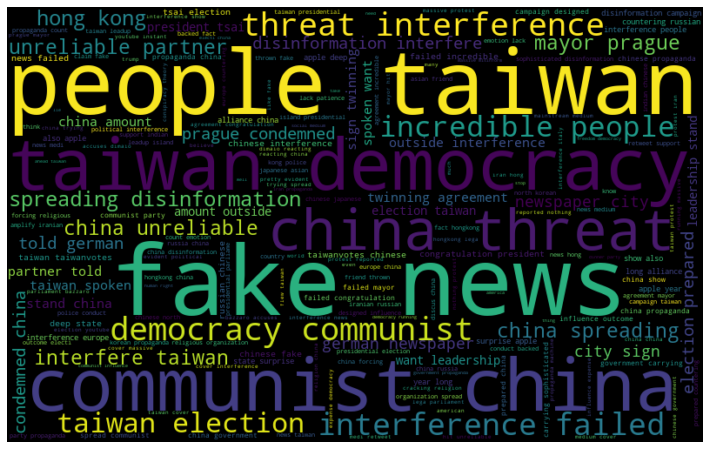

In [164]:
all_words = ' '.join([text for text in text_01_china['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

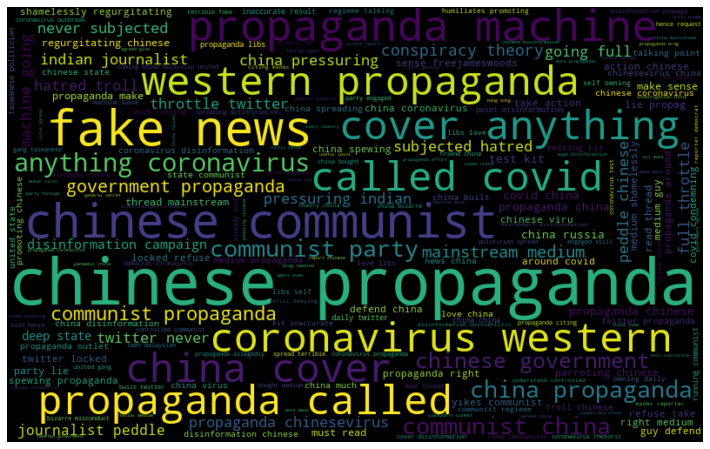

In [36]:
all_words = ' '.join([text for text in text_03_04_china['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# tweet about UK

In [17]:
england = ['england','united kingdom','britain']
pattern = '|'.join(england)
text_01_england = text_01_country[text_01_country.text.str.contains(pattern, case=False)]

In [18]:
len(text_01_england)

1684

In [19]:
for text in text_01_england.text:
    print(text)
    print('-----------------------------')

svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
liberal britain strong flexible forward outward looking identity threatened foreign influence
-----------------------------
svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
svetlana lokhova another victim deep state great britain dropped twitter thread past weekend total
-----------------------------
problem majority passing interest politics likely succumb propaganda peddled corrupt medium agenda wou

box getting ticked accountability binned lie propaganda monopolised medium henry viii ultimate power come pledged police patels stazi little england done
-----------------------------
pinky walshy farage clever pretend concerned trait nazi devalued people vote made exactly brexiteers allowed contrived conspired foreign interference stage coup britain exactly
-----------------------------
boris johnson accused jeremy corbyn peddling little green conspiracy theory britain defence
-----------------------------
leaver wanted brexit remain spent year begging stop lie brexitbritain isola
-----------------------------
false news little england enough last time reasoned response union voter answer benefit cash
-----------------------------
political historian look back period shameful bigotry populism britain
-----------------------------
excellent correct iran shot aircraft iran lobbed rocket airbases iraq trying america part nothing anymore pulled bias great britain taking side fake news
---

-----------------------------
thats propaganda funny mentioned controlled iran mention aoic controlled agreement funded iran broke consessions even though britain majority owner mosaddegh declared britain enemy
-----------------------------
complicated england conspiracy theory make smell betting company hand true
-----------------------------
maybe many britain know widespread strike protest france mainstream medium britain
-----------------------------
merely saying think release report russian interference democracy without anti democratic delay dana russiareport brexit brexitbritain
-----------------------------
tuathail britain need mueller report russian interference glenn simpson peter fritsch releasetherussiar
-----------------------------
vitoff carry propaganda victim actually proper research scotland contributes westminster tell course fund england paying treasury back think desperate keep
-----------------------------
majority people scotland lower counterpart england want 

england scotland wale upgrade rail happening built fabrication
-----------------------------
england scotland wale upgrade rail happening built fabrication fiasco
-----------------------------
fake news weak whiner vile envious little keep spreading hate sure dog britain first love
-----------------------------
harry meghan want freedom britain royal family come america office insult apparently bright believe fake news throughout world realize preserving freedom want
-----------------------------
believe many british medium fan guy really drink kool trump england fake news campaign real point legitimate british paper spread lie meghan name telling truth
-----------------------------
brexit offer british establishment desire nothing deregulation unchaining britain good establishment extremely offer something shutting military security force basis war deep state
-----------------------------
silly google digging hole conversation conspiracy theory northern ireland free choice part united

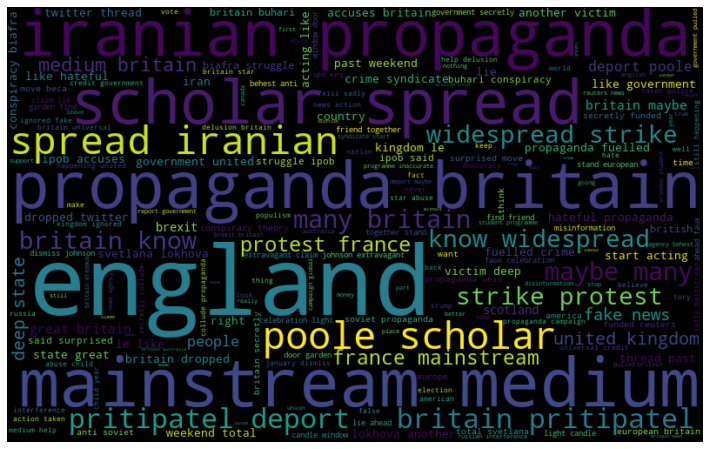

In [20]:
all_words = ' '.join([text for text in text_01_england['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# tweet about Russia

In [22]:
russia = ['russia','russian']
pattern = '|'.join(russia)
text_01_russia = text_01_country[text_01_country.text.str.contains(pattern, case=False)]

In [23]:
len(text_01_russia)

61139

In [25]:
for text in text_01_russia.text:
    print(text)
    print('-----------------------------')

indeed remarkable like remarkable example official russian state propaganda line
-----------------------------
well many like given untrustworthy feel think pick russia today
-----------------------------
forget interference russian president putin like never fake news
-----------------------------
demean debase election process cooperating russian interference demean office demean press demean decorated soldier demean congressional leadership demean judge demean constitution proverbial straw perhaps demeaning senate
-----------------------------
hippie blueeyes pete ofurniture lie military also russia targeting military personnel disinformation trump keep voter know truth thankfully vet know well informed
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
hope christmas break made forget russian interference report
-----------------------------
sisko brexit food shortage medicine shortage lie brea

actually suggested delay publication report alleged russian interference polit
-----------------------------
takeaway mueller report russia massive disinformation campaign dedicated helping trump election campaign welcomed help campaign official contact kremlin operative campaign shared internal data russian intelligence official
-----------------------------
wrong target account poll show absolute bias allowing follower agree follow retweet libs lose election blame russian interference libs lose lame poll deletes blame bot
-----------------------------
idea buffoon release russian interference report
-----------------------------
also answered question russian interference election ignored
-----------------------------
facebook responsible donald trump getting elected think answer reason anyone think elected russia misinformation cambridge analytica
-----------------------------
help continue spout despite disproved mueller brainwashed scotus determined bush gore hillary paid russian 

-----------------------------
daily russian propaganda follow meadow type lying trump nationalist gopcorruptionovercountry
-----------------------------
boom sicario tony stevens effin dunn telling poor sap family history corrupted russian money send antichrist message brainwashing obvious seeing parent pile propaganda kitchen table
-----------------------------
spent year pumping every possible angle russia trump collusion conspiracy blew face release special counsel robert mueller report subsequent testimony congress
-----------------------------
stating russian interference caused hillary lose trump stating believe hillary lost russian interference thousand reason lost evidence russian interference caused hillary lose
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
piqued curiosity gi

seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
julian assange credible source russian asset propaganda maybe
-----------------------------
fake news russia test launch missile
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
russian must upset cyber attack spreading disinformation wheelhouse
---

-----------------------------
charlie kirk noted expert propaganda promoted supported abets russian disinformation twitter news right wing conspiracy conduit fact misleading msnbc continues storied tradition bullshit misinform mass
-----------------------------
amplify iranian russian chinese north korean propaganda count emotion lack patience
-----------------------------
ocasio cortez promotes iran propaganda russian state medium twitter wrong head iran
-----------------------------
maga also russian created hashtag part disinformation campaign promoted putin along trumptrain documented mueller indictment russian whitesupremacists racist embrace
-----------------------------
peterstefanovi peterstefanovi believed nine russian business people gave money conservative party named report russian interference politics suppressed boris johnson election hope
-----------------------------
report russian interference election please thanks
-----------------------------
proof trump russia elec

-----------------------------
actually suggested delay publication report alleged russian interference polit
-----------------------------
anyway election done russian interference report
-----------------------------
ocasio cortez promotes iran propaganda russian state medium twitter wrong head iran
-----------------------------
russian interference politics unacceptable happening releasetherussiareport
-----------------------------
public criticism typically poor journalism propaganda labeled russian disinformation
-----------------------------
need report russian electoral interference released boris johnson releasetherussiareport
-----------------------------
china russia militarily backing iran iraq combat imperialism break propaganda
-----------------------------
russian propaganda spread bernie bros
-----------------------------
watch brutally beating palestinian courtyard aqsa mosque compound appear mainstream medium happening iran hong kong russia
-----------------------------

-----------------------------
hope christmas break made forget russian interference report
-----------------------------
whole post touch cambridge analytica medium russian interference polarization misinfo
-----------------------------
thank everyone involved russian interference
-----------------------------
report russian interference ready made public election
-----------------------------
russian interference politics unacceptable happening releasetherussiareport
-----------------------------
going report russian interference guess whilst boycotting
-----------------------------
thank everyone involved russian interference
-----------------------------
amplify iranian russian chinese north korean propaganda count emotion lack patience
-----------------------------
russian interference politics unacceptable happening releasetherussiareport
-----------------------------
thank everyone involved russian interference
-----------------------------
actually suggested delay publication re

-----------------------------
charlie domestic troll raised russia spread misinformation hiding fact expect
-----------------------------
cherrie picked show entirety commentary russian propaganda
-----------------------------
russian troll take pick
-----------------------------
liked tweet russian propaganda artist claimed iran would attack civilian
-----------------------------
dems bash trump believing intelligence community russia election interference bash trump believing intelligence imminent attack
-----------------------------
carefull fake news spread iran russia note others spread
-----------------------------
farsi fodder conspiracy theorist never know sure look iran would looked worse russian plane rest soul
-----------------------------
hear talking schiff propaganda picture russia letlevspeak
-----------------------------
justify russia interference syrian russia china like one stopped people venezuela overthrow maduro believe silent
-----------------------------
america

-----------------------------
moronic socialist promoted iran propaganda russian state medium claiming islamic republic iran
-----------------------------
dear president trump please courage address nation resign pick reason accept suggestion russian interference muslim travel charlottesville border cage ukraine impeachment iran
-----------------------------
summer year government contractor exposed detailed evidence russian interference
-----------------------------
know love prominent democrat still even unhinged russia conspiracy nut republican
-----------------------------
trump fake putin russian create fake iran website
-----------------------------
russian dividing exploited president shit ally protest congress shit half country ridiculous conspiracy theory profit vote supposed unite behind potus
-----------------------------
trump fake putin russian create fake iran website
-----------------------------
plan sleep well knowing former reality show host beauty pageant organizer b

-----------------------------
disinfo characterized macedonian spammer pushing trump fake news russian trol
-----------------------------
leftwing fascist forsaken fully exposed flatlined treasonous trump russia hoax ukraine
-----------------------------
fake news russia year
-----------------------------
summer year government contractor exposed detailed evidence russian interference
-----------------------------
leftwing fascist forsaken fully exposed flatlined treasonous trump russia hoax ukraine
-----------------------------
intelligence agency provided extensive proof russian interference election trump call hoax trump
-----------------------------
summer year government contractor exposed detailed evidence russian interference
-----------------------------
intelligence agency provided extensive proof russian interference election trump call hoax trump
-----------------------------
intelligence agency provided extensive proof russian interference election trump call hoax trump
---

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
sure doug follow condemning putin russian election interference condoning ther
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
anyone bitch russian propaganda left stand accepting obvious attempt manufacturing support party chosen candidate
-----------------------------
countering russian chinese interference europe
-----------------------------
jordan lord yall watch msnbc pushing iranian propaganda hannity right russia fisa everything else watched show
-----------------------------
russian style disinformation look like congressman gosar fake photo double negative
-----------------------------
real weak addled fool possibly blame others action also blame 

-----------------------------
warns russian interference race boost counterintelligence operation
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
dis

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
doug spent le time watching russian propaganda time watching know irregardless
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
interview venezuela juan guaid russian interference country crisis
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
warns russian interference race boost counterintelligence operation
-----------------------------
dharma inferring think rachel russia maddow said response imminent night spouting idiotic conspiracy
-----------------------------
mccarthy spewing propaganda even given medium tim

-----------------------------
didnt even popular vote even le liked win russian interference severe gerry mandering
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
suddenly intelligence community trusted changed maybe right trump campaign russian interference
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
account russian troll purposely gaslighting spreading lie disinfirmation propaganda
-----------------------------
actually suggested delay publication report alleged russian interference polit
-------------------

-----------------------------
salisbury town subject novichok attack odds close call whether false flag plot blame russia russian attack covered treason prime suspect pulling string either scenario
-----------------------------
misleading america russian phone call terrorist democrat nothing false accusation fake news
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
irrelevant welcome politics politician electorate smart enough filter thing matter russian interference really refer opinion electorate smarter give credit
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
much taxpayer money barr durham spend biased redundant russian interference i

-----------------------------
coached well russian hybrid psychological warfare propaganda tactic
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
haha haha united russian republican party propaganda scared lunatic tweet dirty daddy
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
really find hard keep patience conspiracy theorist contact russia today
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
paul inst peace nothing russian backed propaganda outlet sorry libertarian
-----------------------------
downed russia troop missile medium disinformation distraction blame game still uncovered truth victim iran operation martyr soleimani betrayed
-------------------

exactly justice system work investigate establish element crime found russian interfered help trump trump knew welcomed enough sure legal definition conspiracy
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
allowing discourse euthanism koch financed russian sourced propaganda
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinfo

-----------------------------
word take word easy admin lie teeth every time something yeah take word interesting intel community right deep state russia interference
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
morning patriot russia targeted powerful weaponized propaganda social medium also gave powerf
-----------------------------
cited russian propaganda conspiracy theory website posing academic journal source
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addr

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinform

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
good read veteran targeted russian troll influence voting kentucky democratic veteran council
-----------------------------
brit tying sander warren campaign get nomination narrative foreign interference ukraine lost election like russia nominee trial early primary hold senate
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambass

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated america

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
summer year government contractor exposed detailed evidence russian interference
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propag

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinform

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated america

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinform

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinform

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
leaver bunny kate tucker cornelius brexit prove interference russia trump involvement election ended proving ukrainian party interference election manafort involvement think thing robin
-----------------------------
context spread fascist propaganda justify position hand support russian iranian war published article calling military action israel supporter israel worried believe
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accust

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated america

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
year pouting russia keep falling global press freedom index kremlin disinformation effort
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
zuckerberg trump light brought fake news mass russian propaganda flourished
-----------------------------
year pouting russia keep falling global press freedom index kremlin disinformation effort
---------

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
good luck blame lovely conveniently timed headline grabber instance sitting unpublished russianinterferance russianreport interference british election referendum
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
dis

indication releasing russian interference report
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
danger truly close russia iran airstrikes communalnews geopolitics iran politics propaganda
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
point demogogue tried discredit primary lost bonafide election behavior consistent failure denounce russian interference deeply troubling want anyone like

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated america

howard fineman totally discredited russiagate lie propaganda mean think conclude even steele dossier place donald trump sort deep almost sort animal sense danger avoid work around nice
-----------------------------
howard fineman totally discredited russiagate lie propaganda mean think conclude even steele dossier place donald trump sort deep almost sort animal sense danger avoid work around nice
-----------------------------
howard fineman totally discredited russiagate lie propaganda mean think conclude even steele dossier place donald trump sort deep almost sort animal sense danger avoid work around nice
-----------------------------
howard fineman totally discredited russiagate lie propaganda mean think conclude even steele dossier place donald trump sort deep almost sort animal sense danger avoid work around nice
-----------------------------
howard fineman totally discredited russiagate lie propaganda mean think conclude even steele dossier place donald trump sort deep almost sor

something think already proven russia currently using social medium propaganda sway voter candidate advantageous foreign interest well cyber attacking election said leap
-----------------------------
seeing russian disinformation micro target servicemembers vet family since time
-----------------------------
trump defend encouraged russia interfere russia listening welcomed interference love wikileaks denied russian interference president putin sought interference ukraine treasonous american
-----------------------------
getting news aware russian propaganda website
-----------------------------
hope christmas break made forget russian interference report
-----------------------------
collection mind destroying ideology called leftism byproduct marxism created generation emotionally weak stupid self hating american actually think hating america coolest thing world also russian conspiracy theory contributed
-----------------------------
worried iranian interference everyday life senator

disinfo article wrongly diminishes trump role disseminating russian propaganda gain claim
-----------------------------
full story official assessing whether russia targeting biden disinformation campaign ahead
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
testified help trump fabrication evidence blocking everything russia
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
tool russian disinformation share video questionable source smart
-----------------------------
money deadline quid much money obama give defense russia answer none zero nada want quid check biden seriously stop watching fake news
-----------------------------
nicholas everyone watch magnitsky behind scene made putin critic usual shill russian propaganda bill browder made fairytale cover track saved russiagate saga
-----------------------------
tory campaign lie vot

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
nazi writing russian propaganda
-----------------------------
nazi writing fake news russia insider gonna ahead take sign
-----------------------------
exactly dems need focus money social medium reach people efficiently trump proved parscale facebook skill cambridge analytica data skill foreign company russia propaganda skill hire american
-----------------------------
sister think feel voted robbed presidency trump lie russian propaganda
-----------------------------
progressed russia hoax donald mitch conspiracy getreal
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
testified help trump fabrication evidence blocking everything russia
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
think protest great pre

-----------------------------
official investigating whether russia targeting biden election interference
-----------------------------
googled uranium canadian owned company bought bunch uranium mine controlling uranium russia bought company happened obama year conspiracy russia great friend time
-----------------------------
tool russian disinformation share video questionable source smart
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
full story official assessing whether russia targeting biden disinformation campaign ahead
-----------------------------
never stopped russian misinformation campaign moved full
-----------------------------
replying albright russian putin propaganda
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
tool russian disinformation share video questionable source smart
-----------------------------
newsguar

-----------------------------
full story official assessing whether russia targeting biden disinformation campaign ahead
-----------------------------
course russia disinformation
-----------------------------
full story official assessing whether russia targeting biden disinformation campaign ahead
-----------------------------
tool russian disinformation share video questionable source smart
-----------------------------
full story official assessing whether russia targeting biden disinformation campaign ahead
-----------------------------
scoop official assessing russia targeting biden disinformation campaign ahead electi
-----------------------------
taiwan presidential election writes learn taiwan defend democratic freedom fighting malign chinese russian iranian foreign disinformation influence campaign taiwanelection
-----------------------------
russian interference next election definitely getting savvier could swear heard woman pornhub moan something warren native ancestry
---

coming someone think impeachment mean anything priceless send article stop yapping like loser anything hillary fail fail russian conspiracy fail emolument fail impeachment fail next fail deal
-----------------------------
meme product russian troll factory
-----------------------------
warns russian interference race boost counterintelligence operation
-----------------------------
senior official warning russia election interference could brazen president
-----------------------------
senior official warning russia election interference could brazen president
-----------------------------
herridge freaking already proven republican trash even nellie admits republican paid something totally different stop spewing russian lie propaganda
-----------------------------
report love pronounce evidence wrongdoing biden missed report trump russia last three year know also left quid comment firing prosecutor know news good fake news
-----------------------------
testified help trump fabrication

often story like unnamed source aligns favored narrative others find week later fake news ten thousand fake news piece trump russia collusion think reader would catch
-----------------------------
project election ramp russia online disinformation campaign time expected even
-----------------------------
project election ramp russia online disinformation campaign time expected even
-----------------------------
almost four year fake news outlet selling trump russia collusion hoax
-----------------------------
project happening trump push kremlin backed conspiracy theory ukraine russia interfered
-----------------------------
project happening trump push kremlin backed conspiracy theory ukraine russia interfered
-----------------------------
spent year cry election interference russia segment medium like another note sander handling exceptional surprising even long sold sander thanks guthrie
-----------------------------
government hide jennifer arcuri russian interference
-------------

-----------------------------
also remember trump saying russia nothing election interference believed putin russia nothing well debunked proof realitywinner shared american
-----------------------------
government hide jennifer arcuri russian interference
-----------------------------
every country good something china hiding thing russia fake news exiting blaming others shit used lying zimbabwe defying logic apparently nothing country
-----------------------------
sadly might bring balance election iran interference cancel russia interference
-----------------------------
barr investigating absurd putin tasked congress investigate russian interference election barr facilitated epstein murder epstein devastating info perverted act trump trump absolutely disgusting must yanked
-----------------------------
propaganda know come better discord country suppose senator people either ability discern truth overawed trump really willing russian asset
-----------------------------
nazi writing

disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
nazi writing fake news russia insider gonna ahead take sign
-----------------------------
facebook terrified russian going bombard trump propaganda thing people idiot
-----------------------------
stop willingly using russia playbook disinformation distortion manipulatio
-----------------------------
deep state russia meddled election
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
deep state inside iran shot ukraine russian made rocket tight russia think uranium country dirt deep state passenger
-----------------------------
nazi writing fake news russia insider gonna ahead take sign
-----------------------------
boycott company sponsoring propaganda attem

-----------------------------
nazi writing fake news russia insider gonna ahead take sign
-----------------------------
countering russian chinese interference europe
-----------------------------
hmmm russian propaganda backed zero fact example presented loudly
-----------------------------
given russian propaganda spewed house ongoing effort realdonaldtrump undermine ukrain
-----------------------------
rees mogg released tory russia corrupt collusion report tory propaganda ministry head laura kuenssberg burned
-----------------------------
nazi writing fake news russia insider gonna ahead take sign
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
nazi writing russian propaganda
-----------------------------
sarbanes sugar coat mark zuckerberg russia trump propaganda headline
-----------------------------
nazi writing russian propaganda
-----------------------------
disgustin

-----------------------------
learned last decade primary goal kremlin disinformation strategy convince people narrative important russia sufficient spread discord writes democrace
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
countering russian chinese interference europe
-----------------------------
iran russia interference iran mossadegh polit assassination rezapahlavi puppet islamicrevolution option east west iraq iranwar support sanction jcpoa usagression usembassy clash soleimanikilled
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
know like report russian interference democracy releasetherussiarep
-----------------------------
countering russian chinese interference europe
------------------------

-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
countering russian chinese interference europe
-----------------------------
remember endless russian propaganda trope please troop germany generation
-----------------------------
good news fellow american mueller team found conspiracy trump campaign russia crossfire hurricane investigation senate judiciary committee house select committee month daughter better brain
-----------------------------
countering russian chinese interference europe
-----------------------------
hillary clinton defeated presidential candidate suspect russian interference trump
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
republican charged domestic terrorism purposely spreading propaganda russian mislead amer
-----------------------------
b

another tidbit preceded realitywinner decision blow whistle russian election interference
-----------------------------
warns russian interference race boost counterintelligence operation
-----------------------------
wait usual conspiracy theory donthecon russian propaganda cult true votebluetosaveamerica
-----------------------------
fake news russia
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
vladivostok propaganda russia simon reeve thanks watching like involved support work send email gwplondon please leave comment like involved
-----------------------------
never lifetime think united state senator spread russian propaganda national television
-----------------------------
hope electoral college play russian help spreading false propaganda nothing change except nominee loose electoral college popular vote even larger margin million
-----------------------------
disgu

countering russian chinese interference europe
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
countering russian chinese interference europe
-----------------------------
proved bullshit lie trump touted giving russia
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
countering russian chinese interference europe
-----------------------------
republican reaction investigation based solely lie drunken rumor russian disinformation compared investigation hundred million dollar foreign entity seriously running logical fallacy
-----------------------------
stop lying complete court record showing judge ordered katie johnson trump legal bill case t

-----------------------------
countering russian chinese interference europe
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
countering russian chinese interference europe
-----------------------------
saudi arabia killing country russian interference election north korea sure statement lying
-----------------------------
funny russia blocking fixing country fake news
-----------------------------
name important thing trump lied trump university russian election interference obama birth certi
-----------------------------
nato propaganda bernie millionaire accused repeating russian talking point mention funny hair
-----------------------------
maybe russia propaganda work power hand pple despite tampering stop stop lucked last time trump sneak attack airplane know road lead russia
-----------------------------
report russian interference ready made public election
------------

circulate doctored video recently fact bernie employ people like circulate lie opponent tell everything already knew willing tool right wing russian propaganda
-----------------------------
fake russian hoax fake ukraine phonecall fake impeachment leader sore losing bastard message solut
-----------------------------
disgusting ambassador russia became accustomed addressing disinformation putin propagated american
-----------------------------
warns russian interference race boost counterintelligence operation
-----------------------------
countering russian chinese interference europe
-----------------------------
following evil thief used russian interference presidential election stole presidency another highly qualified opponent named hillary clinton since year evil monthly rally continues disregard rule
-----------------------------
countering russian chinese interference europe
-----------------------------
bernie bros inspired soviet needed russian prostitute ray sheeple truth w

forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
side prominent fabian nearly century fell stalinist propaganda factfinding trip russia pretty loose equivalence
-----------------------------
russia murdoch others spend billion disinformation protect agenda commit
-----------------------------
claim sitting russian interference report
-----------------------------
forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
forcing people serve military listen trump russian propaganda article impeachment
-----------------------------
claim sitti

-----------------------------
boris johnson face call publish russian interference report
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
ignorance matter dems made story russia interference election roundly debunked gotta stop already talking trump russian puppet true
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
euref result fraudulent leave campaign campaign fund illegality datamining cambridge analytica social medium targetting russian interference tory lie turkish immigrant coming
-------

still sitting russian interference report mark urban news
-----------------------------
russian collusion dumbest desperate conspiracy theory ever point thread democrat siding terrorist mean keep collusion crap siding terrorist please stop least thru november
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
actually suggested delay publication report alleged russian interference polit
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
lindsey graham gain exposing rudy anti biden dirt russian propaganda hurting pres trump
-----------------------------
benefited like darkmoney russiagate going away johnson lie catching dissolvetheunion
-----------------------------
russian disinformation behind biden thing like creepily wife finger mouth stage killed
-----------------------------
russian disinform

-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
weaponized disinformation uplifting tweet shared sent russian troll attack
-----------------------------
growing sense johnson deliberately witholding russian interference report released
-----------------------------
growing sense johnson deliberately witholding russian interference report released
-----------------------------
never ending hypocrisy impeachment hoax power resolution russian collusion open border live behind wall
-----------------------------
growing sense johnson deliberately witholding russian interference report released
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
luver hillary clinton 

whole russia thing fake washington post made story asking bill barr hold news conference
-----------------------------
entire second guessed intelligence agency since inauguration russian interference election interfering help trump hurt clinton fact trump called intelligence officer traitor worse
-----------------------------
russianpuppet sold america democracy security russia traitor take cue kremlin spread russian propaganda traitor along goptraitors blocked every effort stop russia hacking future election deflection using soleimani wont work
-----------------------------
pcml greencapital frans biggest hypocrite brussels sprout brexit keep quiet communist spread propaganda russia
-----------------------------
mueller concern conspiracy united takeover coup foreign russian oligarch organized crime
-----------------------------
deep state actually believe corruption dems repudiated accusation russian collusion blah blah blah thrown trump nada nothing zilch crime guy corrupt
--------

-----------------------------
boris johnson face call publish russian interference report
-----------------------------
russia continues ridiculous propaganda even iran admitted shooting ukrainian plane week russi
-----------------------------
russia learn iran situation spared family year disgusting lie unlike victim
-----------------------------
russia continues ridiculous propaganda even iran admitted shooting ukrainian plane week russi
-----------------------------
everybody know brexitjohnson always lie everything hiding russianreport prof
-----------------------------
everybody know brexitjohnson always lie everything hiding russianreport prof
-----------------------------
russia learn iran situation spared family year disgusting lie unlike victim
-----------------------------
russia learn iran situation spared family year disgusting lie unlike victim
-----------------------------
today report russian political warfare interference inside west andrew hastie
----------------------

-----------------------------
testified help trump fabrication evidence blocking everything russia
-----------------------------
fair would acknowledging navy shot even defending action justified different russia incessant spreading fake news conspiracy around
-----------------------------
amplify iranian russian chinese north korean propaganda count emotion lack patience
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
intelligence enforcement assessing whether russia ongoing disinformation effort trying
-----------------------------
could tell truth liar fraud anyone believe would effective president abysmal failure congressman beyond help russian propaganda supported sander liar
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
well well well proof russian election interference profit involvement givin
-----------------------------
senator

-----------------------------
wonder iran took look despite russian denial lie propaganda truth still came
-----------------------------
wonder iran took look despite russian denial lie propaganda truth still came
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
maybe bernie supporter shouldntve quick fall anti hillary russian backed propaganda aimed elect trump worked divide party face sexist smear campaign foreign election interference aimed side
-----------------------------
wonder iran took look despite russian denial lie propaganda truth still came decided better come clean
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
intelligence enforcement assessing whether russia ongoing disinformation effort trying
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
hamfing russian 

liberal would find platform common russia like used trump invested debunked conspiracy theory make comrade
-----------------------------
wait russian interference report
-----------------------------
actually suggested delay publication report alleged russian interference polit
-----------------------------
well well well proof russian election interference profit involvement giving voter registration assuming informed
-----------------------------
late former usaf chaplain blurt apology disgrace congress insulted americanvets patriot woundedwarriors collins proven russian assest spreading
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
friendship institutionalized useful idiot ussr across country russia biggest enemy humanity
-----------------------------
boris johnson face call publish russian interference report
------

soliciting criminal russian interference national televsion though
-----------------------------
mean voter data used target manipulate american voter removing russian domain
-----------------------------
russian active measure twitter american electoral majority
-----------------------------
vladimir putin defends russian prohibiting homosexual propaganda minor mock gender transformer
-----------------------------
liar paying spread fake news lie weaken iran north korea russia paymaster traitor
-----------------------------
prop iran actually admitting saying sorry russian would also hilarious state medium denying minute announcement came poor night shift propaganda press memo
-----------------------------
democrat working hand hand iran russian puppet useful idiot iranian one iran incompetence downing civilian plane show nuclear weapon never hand imagine army suicide nuclear bomber
-----------------------------
russia propaganda project making content designed trump hater left anti a

-----------------------------
uplifting tweet shared russian troll sent rolling stone polled conservative christian
-----------------------------
really maddow like year running russian conspiracy bullshit liberal clown
-----------------------------
would bernie sander disinformation smear help russia like managed become
-----------------------------
indeed great news bloomberg twitter facebook shit russian propaganda bit troll misinformation republican lie country better shape back current
-----------------------------
bernie supporter happy spread russian based anti biden propaganda like clinton
-----------------------------
found oann week appalled watched like russian propaganda believe owner california surprising reason
-----------------------------
example russian propaganda providing cover military operation obligatory rebuttal russi
-----------------------------
internet troll russian twitter make mind want giving slightest clue real identity know conservative pacnw would prude

success disinformation campaign convinced russia bigger abbott useless
-----------------------------
credibly accused pedophile regurgitates russian propaganda floor house company keep client
-----------------------------
vladimir putin defends russian prohibiting homosexual propaganda minor mock gender transformer
-----------------------------
promised release report russian interference politics election
-----------------------------
teaching medium literacy uplifting tweet shared russian troll sent
-----------------------------
russia propaganda project making content designed trump hater left anti american sentiment
-----------------------------
stop trying hard sell cheap propaganda well third country leader know best trump working super wealthy russia course
-----------------------------
evidence impending attack iran function intel community trust russian interference election bias guess allowed important people
-----------------------------
promised release report russian inter

-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
russia hoax continues pelosi say mcconnell accomplice election interference
-----------------------------
explain trump republican party intimate relationship russian mafia leader valdamir putin russian bought trump sorry republican party fact fake news
-----------------------------
tuathail britain need mueller report russian interference glenn simpson peter fritsch releasetherussiar
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
chicago want bernie propaganda getting stronger russia
-----------------------------
russianreport confirms foreign interference frauderendum called
-----------------------------
well news start reporting truth wont call

sure putin puppet daily russian propaganda follow impeachedforlife trumpy
-----------------------------
boris johnson part russia coup front russia strategy propaganda
-----------------------------
tuathail fuck releasetherussiareport boris johnson approves release russian interference report follo
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
russian interference johnson suppression russia report hybrid dark money russia data making
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
russia interference farage campaign putin collusion weaponised hate islamophobia revealed farage leave
--

-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
given likelihood report evidence russian interference referendum liarjohnson proposes
-----------------------------
reminder bernie sander knew russian interfering campaign didnt alert interference advantage admitted interview want play seed doesnt care
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
discus russia sophisticated insidious approach propaganda listen wherev
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
unreal billionaire platform charisma already nominee nobody even close second shameless need russia beyond blackout straight lie
-----------------------------
bcuz obama wanted public russian meddling mcconnell threatened using classified intel s

george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
siskind legislation sits mcconnells desk would prevent russian foreign interference election call
-----------------------------
moscowmitch opposes secure election deterrent russian interference election trump
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
report russian interference releasetherussiareport sure must something please
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------

report published russian electoral interference boris johnson promise
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
alexander reid ross fooling nation extremism russia disinformation ecosystem
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
boris johnson part russia coup front russia strategy propaganda
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
prime minister country suppressed report

-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
reed pelosi accuses mcconnell accomplice russian election interference
-----------------------------
obviously official russian state propaganda line
-----------------------------
reed pelosi accuses mcconnell accomplice russian election interference
-----------------------------
george stephanopoulos asked speake

-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
tuathail fuck releasetherussiareport boris johnson approves release russian interference report follo
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
reed pelosi accuses mcconnell accomplice russian election interference
-------

-----------------------------
reed pelosi accuses mcconnell accomplice russian election interference
-----------------------------
become crumbling democracy serial crisis disinformation attack trump putin russiapublicans vote democratic save truth rule
-----------------------------
voter never fell putin propaganda russian bot lie supporter one fell smear lie maga supporter spread faster wildfire
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi accuses mcconnell accomplice russian election interference breitbart
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
russia propaganda say ukrainian army open fire ukraine army target civilian location introducing
-----------------------------
whoa

-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
robert mueller jailed nobody anything russia lying stuff happened election specifically said vote changed charge anybody kind conspiracy collusion keep hope though
-----------------------------
exposed anna agency russia disinformation campaign current attack idlib
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
discredited theory spread online ally interview tweet embraced president reluctant acknowledge reality russian election interference
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------

think partly true main reason lost past affiliation hating terrorist group recently shouting tent trump visit refusal condemn russia salisbury poisoning unpatriotic propaganda
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
accused accomplice russian interference claiming wonder
-----------------------------
accused accomplice russian interference claiming wonder
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
sundaythoughts pelosi mcconnell backing trump nothing election security russian interference
-----------------------------
sundaythoughts pelosi mcconnell backing trump nothing el

report russian influence musing unnamed security state goon using bloomberg
-----------------------------
iran jihad regime shooting plane mistake russiagate proven treacherous conspiracy
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
choose believe intelligence community accountable democratic institution believe murdoch owned station russian propaganda say without malice wish great sunday malcolm
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian 

-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
report russian influence musing unnamed security state goon using bloomberg
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
pelosi question mcconnell allegiance come russian interference usually throw direct serious accusation shot like moscowmitchmcconnell thisweek
-----------------------------
pelosi asked mcconnell acc

-----------------------------
bernie hosting town hall news putin trump propaganda channel sent another russian flag
-----------------------------
marr russian interference report going published security minister brandon lewis say come
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
soviet propaganda poster depicts poland barrier preventing union germany soviet russia
-----------------------------
prototype ordered nancy replace arrived considered russian interference government russiarussiarussia pelosidrunk shampeachment trump witchhunt
-----------------------------
jordan think think almost anyone 

-----------------------------
either corrupt russian know blue collar anything propaganda
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
another deep state forehead member cover much fake russia coup participant


-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
still sitting russian interference report mark urban news
-----------------------------
johnson probably hope forget russian interference report releasetherussiareport
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
heart grieve scrutinyphobe boris johnson face call publish russian interference report
-----------------------------
anyone know report russian interference surely nothing hide
--------------------

-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
funny type article come guess voice america never propaganda piece russian spending interference
-----------------------------
peterstefanovi everything marr failed tory brandon lewis today report russian interference
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
everything marr failed tory brandon lewis today report ru

-----------------------------
doubt substituted incriminating evidence russian interference removed marr
-----------------------------
russian putin propaganda russian military aggression eastern ukraine topic
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
propaganda side effect audience backlash entertainer politician behind audience notice government controlled corporation china russia saudi arabia connected directly law
-----------------------------
marr today

everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
still sitting russian interference report mark urban news
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
brandon lewis said government release russia report electoral interference soon
---------------------------

marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppr

marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppr

example russian propaganda providing cover military operation obligatory rebuttal russi
-----------------------------
trump block russian election interference trump path victory kremlin
-----------------------------
news boris johnson face call publish russian interference report
-----------------------------
year still fucking still talking russian like bullshit propaganda psyop move original propaganda bullshit shove people throat rachel
-----------------------------
also psychopath totally absurd conspiracy theory explain russian meddling
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
example russian propaganda providing cover military operation obligatory rebuttal russi
-----------------------------
navalny member enfeebled russian opposition quiet last year iranian protest russian remain passive believe putin lie
-----------------------------
releasetherussiareport getting stupidity going away brexit poison 

-----------------------------
boris johnson face call publish russian interference report
-----------------------------
claim sitting russian interference report
-----------------------------
folk better think long hard treasure trove dubious video footage bernie view decade russian disinformation gonna field vote accordingly
-----------------------------
iran disinformation threat differs russia likewar left
-----------------------------
leftist medium russia terrible scourge also leftist medium post russian iranian propaganda make trump america look
-----------------------------
single turkey russia actor whose interference causing concern washington state
-----------------------------
going text every till election back paper ballot much corruption russian interference
-----------------------------
single turkey russia actor whose interference causing concern washington state
-----------------------------
tarrant quid obama colluding russia medium silent fake news real news organiza

russia propaganda project making content designed trump hater left anti american sentiment
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
russian republican ta lie propaganda like russia ussr went broke fell apart afghan glad stupid wait
-----------------------------
boris johnson face call publish russian interference report
-----------------------------
boycott company sponsoring hannity propaganda attempt help russia
-----------------------------
appreciate politeness pizzagate thoroughly debunked america full conspiracy theory probably russian internally attack america personally stick fact backed hard evidence thing proven good luck
-----------------------------
schalk brit future rugby lie europe schalk brit future rugby lie europe thisschalk brit gallo image related linksvisa delay tongan centre arrival bullssharks lose pukke thumping russiabulls
-----------------------------
russian disinformation behind b

siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
tactic every grifter power every fascist budding authoritarian like johnson follows game plan putin domestic propaganda indoctrination russian electorate keep getting elected
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
liddle schifty become expert russian p

cuda erik prince seychelles liaison george nader witness special counsel probe russian interference presidenti
-----------------------------
cuda erik prince seychelles liaison george nader witness special counsel probe russian interference presidenti
-----------------------------
notty george nader witness special counsel probe russian interference election admitted monday
-----------------------------
dont feed troll apparently russian understand welfare police fireman interstate socialist
-----------------------------
worried russian interference prevent
-----------------------------
notty george nader witness special counsel probe russian interference election admitted monday
-----------------------------
russian style disinformation tactic whether employed russian american donaldtheimpeached represent major
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
russian interference part brexit great 

dear much longer intend keep report russian interference politics locked away
-----------------------------
cuda erik prince seychelles liaison george nader witness special counsel probe russian interference presidenti
-----------------------------
investigation establish trump campaign conspired coordinated russian government election interference activity robert mueller going forget part fake news played abomination
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------


george stephanopoulos asked speaker pelosi today worried russian interference
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
want read report russian interference please publicly funded released principle hidden releasetherussiareport
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
last bastion left fact must forward feeling fact call poster troll personal favorite russian asset internet much like child magic ball actually tool
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
obama courted russia

-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
someone knowledge speaks record know believe feel like misinformation russia circa
-----------------------------
hidalgo radio free europe shit radio free asia trying promote propaganda among russian iran
-----------------------------
smell like russian divide conquer interference
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
apun dude kaunsa ganja maara hain wonder world nahin hain wonder list jisme country aate hain china kazakhstan kyrgyz republic russia tajikistan uzbekistan india dont spread fake news
-----------------------------
meant report russia russian interference politics
-----------------------------
conspiracy crazed pelosi sugg

alexandria ocasio cortez liked tweet russian funded operative spreading iran propaganda
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
libs trumpkins bunch racist conspiracy theorist also libs white house snow photo definitely message russia
-----------------------------
syria disinformation photo civilian opposition held idlib appealing russia
-----------------------------
problem mccarthyism asserted huge conspiracy across multiple agency found fruitcake current russian trouble keep popping throughout entire republican party conservative movement
-----------------------------
conspiracy crazed pelosi suggests mcconnell working russia
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
julian assange expose russia hoax russia never hacked insider named sethrich hacked podesta email gave info wikileaks

-----------------------------
attention resister question worry upcoming presidential election worry russian interference flipping senate please follow thank strongertogether votebluenomatterwho
-----------------------------
russian funded american politician pushing russian disinformation
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
conspiracy crazynancy suggests working russia nancypelosifakenews
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
bernie never disparaged fake 

-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
wonder mitch mcconnell pelosi accuses leader accomplice russian election interference
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
stfu racist treasonous goputinpuppet much russia paying propaganda goptraitor votebluetoendthisnightmare
-----------------------------
president zelenskyy agreement steinmeier formula took ukrainian russian medium storm side engaged spreading biased false narrative
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
gallop time naughty nancy rhetoric review taxpayer money russian hoax money ukrain
-----------------------------
people re

dear much longer intend keep report russian interference politics locked away
-----------------------------
communist news network truthful heavy sarcasm fake news good lie propaganda russian defense ministry denies warship aggressively approached navy ship
-----------------------------
best debunk conspiracy theory would publish russianreport
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
fear russian interference much stake
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
markey mark retraction fake news orange pumpkin accusing clinton selling uranium russia another opinion masked fact poltiburo member trump cleared clinton
-----------------------------
dear much longer intend keep report russian interferen

dear much longer intend keep report russian interference politics locked away
-----------------------------
wonder mitch mcconnell pelosi accuses leader accomplice russian election interference
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-----------------------------
leadership stuff awesome perfect opportunity chase russia report interference election politburo letting
-----------------------------
brandon lewis said government release russia report electoral interference soon
-----------------------------
fear russian interference much stake
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
kremlin disinformation leader wait find someday russia hold republican party email illegal campaign money
-----------------------------
f

dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
russian interference interference russian wanted russia
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
join news paid million spread russian propaganda
-----------------------------
dear much longer intend keep report russian interference politics locked

marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
invaluable need whoever making decision please rethink essential fighting russian disinformation propaganda
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
prime minister country suppressed report russian interference politics election
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
russian troll account guy
-----------------------------
news boris johnson f

really pelosi abomination actually pelosi putin abomination moscowmitch congress evil minion running interference russianmobboss
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
pelosi sound incoherent confused clip made sense whatsoever rambling election interference party done damage russian ever
-----------------------------
great difference soviet propaganda latest russian variety soviet idea truth
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
elvis sighted past month flatlined fully exposed treasonous trump russia hoax plot
-----------------------------
pelosi asked mcconnell accomplice interfere

fair feeling dems fair election none voter suppression russian interference unchecked might well vote candidate aligns policy hope stop election stolen
-----------------------------
fear russian interference much stake
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
sistance forget trump falsely skewering hillary clinton bernie cult three fuel fire russian disinformation campaign throughout runup election
-----------------------------
conspiracy theorist issue think possible government create earthquake russia manipulate weather triangulate storm perhaps haarp herald angel sing
-----------------------------
vinograd russian style propaganda committed consistency goal confuse
-----------------------------
hard worried russia already running point election interference yanggang
-----------------------------
fear russian interference much stake
-----------------------------
fear russian interference much s

maggie really stupid said lying press peddle fake news story like russia hoax enemy people grow
-----------------------------
propaganda like trumpanzee parrot puppet brain memory span gnat russialovingdictatorwannabe putinpuppet moscowasset americantraitor proven bull crap traitor traitor
-----------------------------
sundaythoughts pelosi mcconnell backing trump nothing election security russian interference
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
pelosi accuses mcconnell accomplice russian election interference
-----------------------------
moscowmitch pas bill protect election possible reason like dictatorship move russia like democracy election free foreign interference
-----------------------------
nope created russian propaganda bill communist talk bellied commie good
-----------------------------
pelosi accuses mcconnell accomplice russian election interference
--------------------------

certainly solved russian interference last even think deal mentality shift still happening embraced mostly black need listen saying
-----------------------------
anyone know report russian interference surely nothing hide
-----------------------------
kelly mention ramping bogus russia interference chinese american national going chinese communist payroll bipartisan senate report making number
-----------------------------
everything marr failed tory brandon lewis today report russian interference politics
-----------------------------
please stop sponsoring propaganda attempt help russia clear present danger
-----------------------------
liberal medium like keep saying debunked conspiracy sooner later face fact fact dems ukraine accused trump russia
-----------------------------
shamelessly spread misinformation even russian fake news pale comparison
-----------------------------
report russian interference politics suppressed boris johnson election continuin
-------------------------

accused accomplice russian interference claiming wonder
-----------------------------
never trust follower month soros paid fake russian troll
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
moscowmitch opposes secure election deterrent russian interference election trump
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
pelosi asked mcconnell accomplice interference russian election defende
-----------------------------
russiahoax starter pretty much genesis fake news follow
-----------------------------
marr today tory brandon lewis refused report russian interference politics suppresse
-----------------------------
dominic grieve say intelligence committee report russian interference politics blocked number
-----------------------------
speaker pelosi discussing ongoing russian interference election sometime

-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
trumprussia conspiracy continues commit crime moscowmitch attempting acquit trump without allowing evidence speak republican party literally letting trump away crime president
-----------------------------
back start russian propaganda machine putin least tell bill
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
shocked said ever house democrat keep investigating trump russia conspiracy impeachment
-----------------------------
looking forward joining tonight discus russian interference operation election
-----

-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
establishment pundit nut russian hacking conspiracy
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian inte

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
would like hear colleague distinguished american attorney idiot sucked russian conspiracy theory rabbit hole
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
scale crazy n

rachel madcow whose russiagate conspiracy mongering legendary immediately jumped time mockingbird story
-----------------------------
novella government hide jennifer arcuri russian interference
-----------------------------
boris johnson suppressed report russian interference politics election continues orches
-----------------------------
excellent essay quote tweet fooled russian active measure
-----------------------------
excellent essay quote tweet fooled russian active measure
-----------------------------
excellent essay quote tweet fooled russian active measure
-----------------------------
gun mean resistance chicoms left fascist russian conspiracy debunked mueller farce fell apart live
-----------------------------
russian interference created podesta purpose framing donald
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
nancy forgot mention mueller report finding showed 

alexander reid ross fooling nation extremism russia disinformation ecosystem boundary excellent writer guest show really worth read
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
house democrat keep investigating trump russia conspiracy impeachment
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
despicable already proven special prosecutor russian collusion happy spread lie disinformation unduly sway election embarrassment america
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democ

-----------------------------
anything welcome russian interference make easy rep benefit watch american people cherished benefit democracy freedom vote choice vote counted stolen shameless
-----------------------------
russian interference created podesta purpose framing donald
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
really going back broken idiotic russian collusion conspiracy fairytale
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
---

-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
sipher trump get impeached russia hack burisma ebook ukraine centrality trump russia putin giuliani biden firtash outlining trump coopting kremlin medium fall russian disinformation miss picture
-----------------------------
polumbo yikes evidence russia altered vote count none spreading conspiracy theory
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
lost interest watching game espn used propaganda campaign format corrupt russian impeached orange magat society appointed executive hailed nazi confederacy loyalist stadion espn nazi appeaser
-----------------------------
trump get impeached russia hack burisma ebook ukraine centrality trump russia putin giuliani biden firtash outlining trump coopting kremlin medium fall russian disinformation mis

-----------------------------
many investigation russia interfering election election interference right nose
-----------------------------
fake news restarted russiagate hoax person holding account taking legal action
-----------------------------
worried democrat interference election russia nancy stated
-----------------------------
please least come conspiracy theory russia hoax boring
-----------------------------
nancy forgot mention mueller report finding showed russian interference presidenti
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
obama administration think russian interference enough intercede agree election decided american people citizen provide clear verifiable proof
-----------------------------
seek help desperate nancy pelosi hope trotting russia stole election conspiracy save crumblin
-----------------------------
work russian state propaganda disinfo medium

matter important country boris johnson blocked publication russia report russian influence tory come report threat national security also publish russiai propaganda money
-----------------------------
wonder reality winner woman first warned russian interference election could pardo
-----------------------------
nancy forgot mention mueller report finding showed russian interference presidenti
-----------------------------
russian interference judiciary constitutes critical nationalsecurity threat threat level rise signific
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
boris johnson suppressed report russian interference politics election continues orches
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine dem

setting stage impeachment hearing republican want hunter biden democrat scream anything burisma russian propaganda take bank
-----------------------------
really question really know history post soviet propaganda russian federation troll
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
russian interference created podesta purpose framing donald
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
trump get impeached russia hack burisma ebook ukraine centrality trump russia putin giuliani biden firtash outlining trump coopting kremlin medium fall russian disinformation miss picture
-----------------------------
many investigation russia interfering election election interferenc

-----------------------------
like last despite fact mueller proved interference attempt russia unsuccessful
-----------------------------
look like russian holiday troll factory worker back vacation getting back work
-----------------------------
much dems forced american taxpayer waste russia hoax million million
-----------------------------
boris johnson suppressed report russian interference politics election continues orches
-----------------------------
boris johnson suppressed report russian interference politics election continues orches
-----------------------------
first step securing election voter talk russian interference okay importing illegals central america vote resettling refugee strategic district vote dems even campaigned mexico vote
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
--

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
really going back broken idiotic russian collusion conspiracy fairytale
-----------------------------
craig dossier originally funded candidate like senator cruz others nothing opposition research came time general election clinton obviously sought opposition research nobody could predicted russian interference
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
msnbc warning burisma email allegedly hacked russia mig

-----------------------------
suggest russian government ability persuade american voter disinformation
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
russian interference part brexit great cambridge analytica hack
-----------------------------
boris johnson suppressed report russian interference politics election continues orches
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
potus need plan protect election russian interference gonna impeach
-----------------------------
democrat mike quigley intelligence committee went msnbc push debunked russia 

-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
still refuse protect russian interference
-----------------------------
know speak russian fake news
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
--------

-----------------------------
revealed project veritas like wikileaks russian active measure operation
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
honey stop hillary clinton quick push election russian conspiracy theory whoa nelly lotta back
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
sailer lockstep whatever next smart money intellectual fashion today giving talk danger stop spread fake news coming putin russia sorry long thread honestly bullshit hitchen
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
msnbc warning burisma email allegedly hacked russia might disinformation entire
-----------------------------
russian interference created podesta purpose framing donald

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
proven done alluding russian collusion proven paid dems white supremacy watch entire video doctored tape president made million political office office year pelosi blunt water schumer reid
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president 

-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
maddow lied america year russian collusion delusion told clinton fake dossier true pushed talking point fisa abuse republican conspiracy
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
really russian interference russian find dirt garbage politician like hillary biden
-----------------------------
trump want interference russia country help steal election
-----------------------------
report ongoing russian in

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
peep trump show russia interference begging many nation interfere investigate positive proof russia russia enjoying trump bending putin every whim
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
mueller chief staff say washington enough secure election report russian interference
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing r

-----------------------------
russian intelligence agent hacked ukrainian company dirt biden replay interference clea
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
intelligence committee democrat push debunked russia conspiracy theory impeachment back russia
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
course rand paul want whataboutism russian propaganda technique basis selecting witn
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing ru

report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
hilary clinton woman whose husband rejected blonde bimbo right wing conspiracy presidential election russia whole life people flaw devious nature
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy highlight
-----------------------------
report ongoing russian interference election benefit president undermine democracy hig

-----------------------------
fact andrey buzarov ukraine easter scholar miraculously avoided death flight switching ticket later russian aggression georgia actively engaging disinformation information
-----------------------------
know russia hacked burisma likely leak email slip doctored email vice presi
-----------------------------
woman presidency hillary popular vote russian interference
-----------------------------
nearly concerned russian interference people voting blue elector ultimately
-----------------------------
like gremlin midnight russia conspiracy xenophobia
-----------------------------
quite made unethical illegal choice cooperate russian election interference collaborater agent definately strenghthened russia position international relation
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
know russia hacked burisma likely leak email slip doctored email vice presi
------------------

know russia hacked burisma likely leak email slip doctored email vice presi
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
deep state meddling russian stick getting
-----------------------------
know russia hacked burisma likely leak email slip doctored email vice presi
-----------------------------
lady gentleman question ever consider surest predictable tool russia interference election think russia help irritate trump administration blowback
-----------------------------
might important news ru

might important news russia could leak burisma email slip doctored email
-----------------------------
burisma heart impotus claim hunter biden corrupt right along ukraine government russian hack system certainly seed disinformation outright fabrication nothing though
-----------------------------
release russian interference report
-----------------------------
compromised owned russia kompromat dark money donation secret offshore account need election support america democracy rule resort lie cover propaganda vote
-----------------------------
every minute russian troll tweet disinformation divide voter sadly democrat taking bait
-----------------------------
challenge notion false narrative establishment democrat throw around surge poll outspoken russia interfering election sound like trumper pushing conspiracy theory inforwars
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russiangru disinformatio

might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
fake news restarted russiagate hoax person holding account taking legal action
-----------------------------
jasonm centrist democrat think russian interference also played part misinformed hope wake putin driver seat
-----------------------------
george nader witness former special counsel mueller probe russian interference election pled guil
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
woman presidency hillary popular vote russian interference
-----------------------------
mueller chief staff 

would time article ukraine interference russian used cover
-----------------------------
fisa court appointment david kris sign complicity russian collusion hoax part deep state auditfisa hack picked fisa court reform abuse even worse thought
-----------------------------
corrupt woman corrupt family gained wealth taxpayer salary type delusion live think russia propaganda machine realize meddled foreign election year
-----------------------------
establishment pundit nut russian hacking conspiracy revealing head major mainstream
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
press attention getting much simply carry sign saying release russian interference report
-----------------------------
press attention getting much simply carry sign saying release russian interference report
---------------

establishment pundit nut russian hacking conspiracy revealing head major mainstream
-----------------------------
fake news restarted russiagate hoax person holding account taking legal action
-----------------------------
reality winner jail warning russian interference
-----------------------------
boreing shifty shiff demtards obsession russian interference pathetic
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
look like russian troll farm busy boycottmapleleaf hashtag also funnily enou
-----------------------------
veritas democrat radicaldimms pushed russian disinformation year started steeledossier continues today left iran narrative maga americafirst impeachmentbackfire
---------------------

afflicted democrat propaganda medium wing claiming burisma hacked russia classic
-----------------------------
mueller chief staff say washington enough secure election report russian interference
-----------------------------
news chris wallace juan williams donna brazile jonah goldberg table news family bribed blackmailed threatened soros russia deep state ceo
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
fake news restarted russiagate hoax person holding account taking legal action
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
mueller chief staff say washington enough secure election report russian interference russiareport trumprussia putinsbrexit today politicslive newsnight news
-----------------------------
true fairness trump guilty epic crime russian collusion taxdodging election interference
---------

fake news restarted russiagate hoax person holding account taking legal action
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
information fake news russia article name trusted news source election information important actual fact
-----------------------------
many deep southern democrat cause heard people would vote liberal word democrat lose lack unity year calculated misinformation meddling russian government people forget
-----------------------------
burisma hacked full attack election independent running away drive thought crime speculation feeling thought opinion nice frank read russian active measure report shut
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
intelligence conceal russian interference burisma election
-----------------------------
welcome fifty shade darker remake rus

-----------------------------
republican mcconnell trying steal next election allowing russian interference
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
back russia hoax according report yeah right sorry schiff know lip moving lying give looking pathetic election interference need worry voter fraud trump landslide
-----------------------------
news russia hacking company center hunter biden conspiracy today skepti
-----------------------------
votingblue single receipt blue accusation back extraordinary claim like folk assume russia propaganda work
-----------------------------
talking russian hacker election interference lack commentary around leadership morningjoe
-----------------------------
wait russia pas trump clan crook imagine doctored email believing immediately peep
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election r

boris johnson reveals bombshell report russian interference british democracy published week
-----------------------------
mueller chief staff say washington enough secure election report russian interference
-----------------------------
mueller chief staff say washington enough secure election report russian interference
-----------------------------
fool falling russia election interference like magas fall trump propaganda better voteblue
-----------------------------
establishment pundit nut russian hacking conspiracy revealing head major mainstream
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
establishment pundit nut russian hacking conspiracy revealing head major mainstream
-----------------------------
time legitimate reason believe involved kind cyberattack burisma alone found anything worth publishing information medium push anti russia coldwar propaganda
-----------------------------
lates

attorney indicted russian july took disclosure information back fake bulshit info leaked site released doctored page real disclosure information already hand judge russia shithole country
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
siskind saying russian interference behalf trump already happening trump facing impeachment
-----------------------------
trump illegal cheating help foreign russian interference continues hacking meddling election meanwh
-----------------------------
happily bung ru

-----------------------------
russian master disinformation anything found could well used spread disinformation propaganda anything must held completely suspect russianliesanddisinformation russianpropagandahurtsusa
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
propaganda campaign cambridgeanalytica russian reason trump president brexit
-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
report russian interference coming issue called journalist
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
civil society organisation ge

-----------------------------
dear much longer intend keep report russian interference politics locked away
-----------------------------
conspiracy crazed pelosi suggests mcconnell working russia democrat longer live reality based world
-----------------------------
people reminded boris johnson suppressed report russian interference politic
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
expect massive disinformation russian troll activity escalate exponentially
-----------------------------
establishment pundit nut russian hacking conspiracy revealing head major mainstream
-----------------------------
seriously still trying help hillary idiot know lost stupid chick toni lost russian conspiracy whore hillary paid russains fake dossier proven fact
-----------------------------
kielland russian hacked burisma leak doctored email biden
-----------------------------
might important news russia could lea

-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
stealing email credential assume repeat russian interference last privacy
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
vet supporting russian propaganda make byebye
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
pushing russian propaganda
-----------------------------
need moscowmitch stop blocking bill provide cyber security russian interference stand
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
breaking report russia hacked ukrainian firm burisma attack strikingly similar impeached lawless still asking russian interference allroadsleadtoputin housegop
----------------

-----------------------------
assad putin president worked well syria cleaning deep state weapon secret agency russia always ally president trump brilliant invited probably world changing better
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russian say anything flag must always always report according narrative according fact yeah real chance protest downed plane report essentially totally unreliable
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored 

might important news russia could leak burisma email slip doctored email
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russia trying help trump believe people still believing russian propaganda cult world believable russia still listening time
-----------------------------
russia bold putin know pushback puppet inviting foreign interference
-----------------------------
conspiracy crazed pelosi suggests mcconnell working russia democrat longer live reality based world
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russia bold putin know pushback puppet inviting foreign interference
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------


conspiracy crazed pelosi suggests mcconnell working russia democrat longer live reality based world
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
welcome fifty shade darker remake russian election interference effort elect donald
-----------------------------
welcome fifty shade darker remake russian election interference effort elect donald
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
welcome fifty shade darker remake russian election interference effort elect donald
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
welcome fifty shade darker remake russian election interference effort elect donald
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
we

-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
look like russian misinformation facebook
-----------------------------
russian propaganda
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
conspiracy crazed pelosi suggests mcconnell working russia democrat think republican russian agent well would make democrat iranian agent much worse
-----------------------------
look like russian troll farm busy boycottmapleleaf hashtag also funnily enou
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
agreed make matter worse founder justice democrat saying proof russian interference reason ignore
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
siskind hoping medium

another angle paint rudi evidence illegally obtained hacked material get tied investigation slap russian election interference label stick
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
trump keep russian misinformation alive
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
might impor

-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
siskind hoping medium help russia amplify stolen information disinformation democratic candidate
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
russian hacking playbook right russian hacked burisma leak doctored email
-----------------------------
going multiple fact check article discussing veracity thread neon really laugh loud evidence say prominent right nationalist spread fake conspiracy theory russian control oscar
-----------------------------
might important news russia could leak burisma email slip doctored email
-------------------

-----------------------------
infinite credible blaming russian spreading conspiracy theory real ukra
-----------------------------
siskind reminder according forensic accounting russian interference changed outcome election russia
-----------------------------
russian disinformation campaign elect trump well underway republican better fucking something treasonous
-----------------------------
russia turn shit like disinformation news story circulate fabricated email info trump dummest follower soak entertainment news
-----------------------------
siskind saying russian interference behalf trump already happening trump facing impeachment
-----------------------------
siskind hoping medium help russia amplify stolen information disinformation democratic candidate
-----------------------------
putin repeating cyberattacks election democracy russia military hacker breached burisma whose board hunter biden clearly boost trump disinformation campaign putin really want help asset know need
-

-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might could leak russian everywhere doctored email threat like podesta email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
siskind saying russian interference behalf trump already happening trump facing impeachment
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
trump always conspiring russia next phase conspiracy
-----------------------------
russian today someone tell trump racist told watching much fake news
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
siskind saying russian interference behalf t

might important news russia could leak burisma email slip doctored email
-----------------------------
realclarkm defender claiming fake person mean must made russian operative spread misinformation continously yeah forgot dumbass donald office information like used court
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
schiff also said report ukrainian election meddling russian
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
pelosie crazy anything naughty hatefull mouth treating mitch like child gone mind conspiracy crazed pelosi suggests mcconnell working russia
-----------------------------
might important news russia could leak burisma email slip doctored email
-----------------------------
democrat keep talking russian election interference distract election tampering tech
-----------------------------
siskind remi

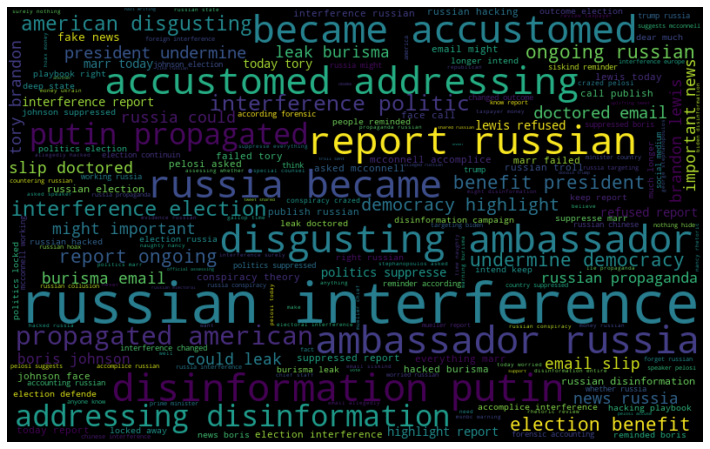

In [165]:
all_words = ' '.join([text for text in text_01_russia['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# tweet about USA

In [161]:
us = ['america','united states']
pattern = '|'.join(us)
text_01_us = text_01_country[text_01_country.text.str.contains(pattern, case=False)]

In [162]:
len(text_01_us)

80426

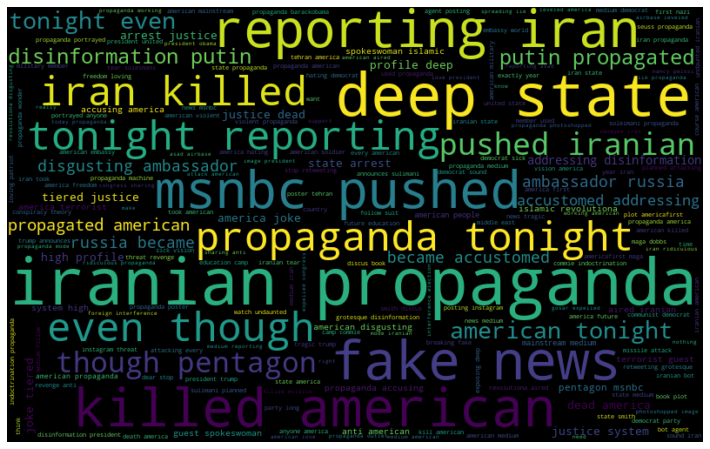

In [166]:
all_words = ' '.join([text for text in text_01_us['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [70]:
# from sklearn.feature_extraction.text import CountVectorizer
# dtm_vectorizer = CountVectorizer()
# dtm = dtm_vectorizer.fit_transform(text_01_china.text_tag).toarray()

In [71]:
# from sklearn.feature_extraction.text import TfidfTransformer
# transformer = TfidfTransformer()
# tfidf = transformer.fit_transform(dtm).toarray()

# tweet about coronavirus
1.See if there is a tweet about the new coronavirus associated with the country

In [38]:
coronavirus = ['coronavirus','covid-19','covid','new coronavirus','corona virus']
pattern = '|'.join(coronavirus)
text_01_coronavirus = text_01_mining[text_01_mining.text.str.contains(pattern, case=False)]

text_03mid_coronavirus = text_03mid_mining[text_03mid_mining.text.str.contains(pattern, case=False)]

text_03_04_coronavirus = text_03_04_mining[text_03_04_mining.text.str.contains(pattern, case=False)]

In [39]:
print(len(text_01_coronavirus),len(text_03mid_coronavirus),len(text_03_04_coronavirus))

1 113066 210974


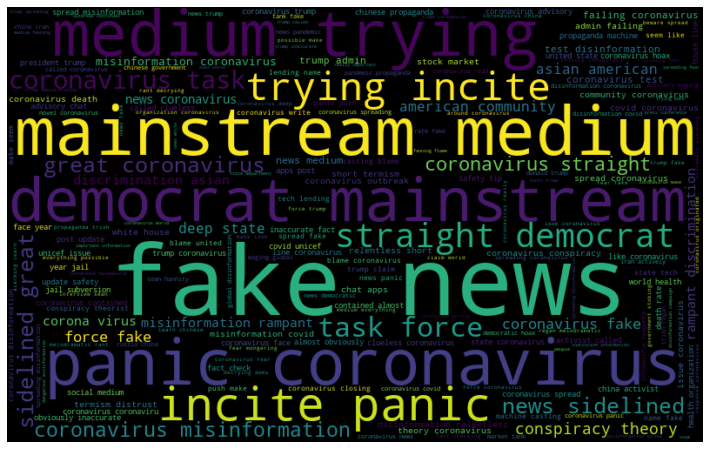

In [41]:
all_words = ' '.join([text for text in text_03mid_coronavirus['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

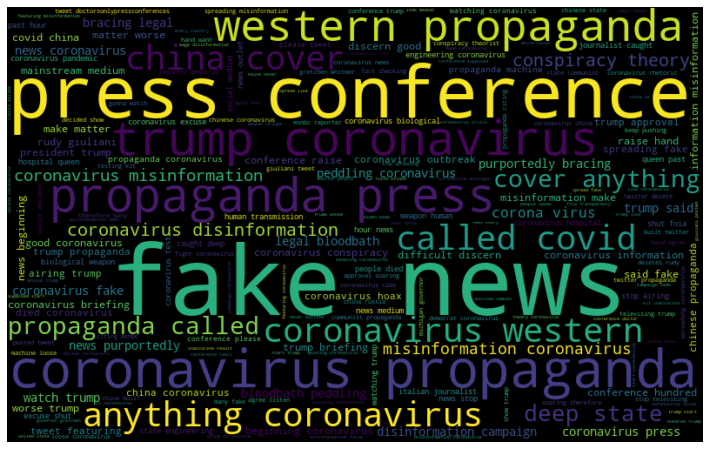

In [42]:
all_words = ' '.join([text for text in text_03_04_coronavirus['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [43]:
#about china

In [45]:
china_coronavirus = ['coronavirus','covid-19','covid','new coronavirus','corona virus','china','chinese']
pattern = '|'.join(china_coronavirus)
text_01_china_coronavirus = text_01_mining[text_01_mining.text.str.contains(pattern, case=False)]

text_03mid_china_coronavirus = text_03mid_mining[text_03mid_mining.text.str.contains(pattern, case=False)]

text_03_04_china_coronavirus = text_03_04_mining[text_03_04_mining.text.str.contains(pattern, case=False)]

In [46]:
print(len(text_01_china_coronavirus),len(text_03mid_china_coronavirus),len(text_03_04_china_coronavirus))

11449 132591 397638


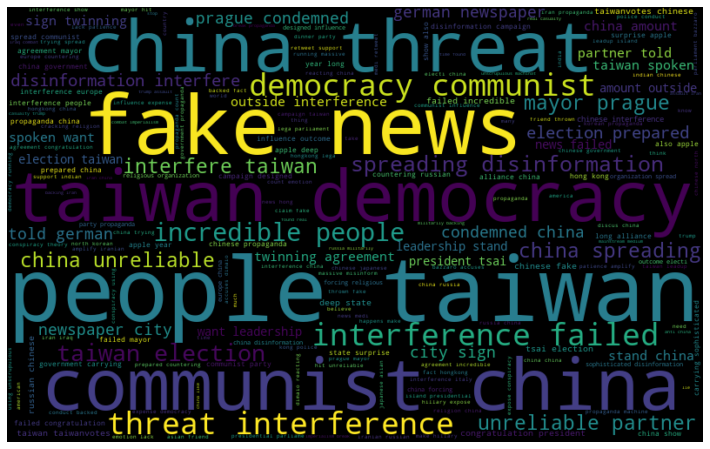

In [47]:
all_words = ' '.join([text for text in text_01_china_coronavirus['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

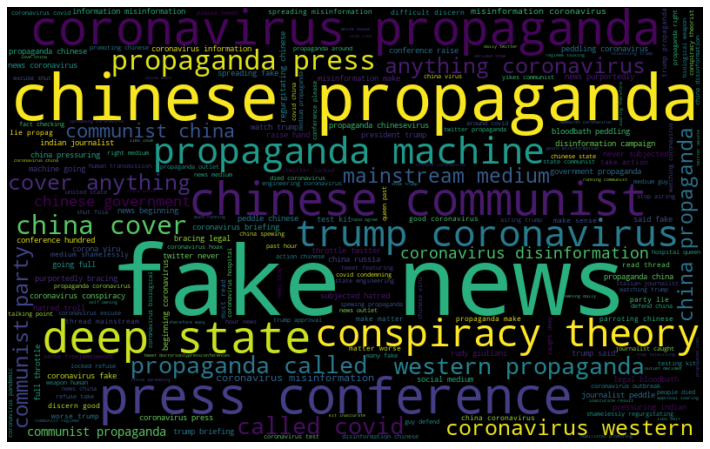

In [49]:
all_words = ' '.join([text for text in text_03_04_china_coronavirus['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

# Try using dictionary matching to find tweets with negative sentiment

In [125]:
# reference: https://www.cs.cmu.edu/~biglou/resources/
bad_words = pd.read_table('bad-words.txt',header=None)

In [128]:
bad_words.reset_index(inplace = True)

In [129]:
bad_words = bad_words[0].values.tolist()

In [134]:
pattern = '|'.join(bad_words)

text_01_bad_words = text_01_country[text_01_country['text'].str.contains(pattern, case=False)]

text_03mid_bad_words = text_03mid_country[text_03mid_country['text'].str.contains(pattern, case=False)]

text_03_04_bad_words = text_03_04_country[text_03_04_country['text'].str.contains(pattern, case=False)]

In [135]:
print(len(text_01_bad_words),len(text_03mid_bad_words),len(text_03_04_bad_words))

234303 154769 347996


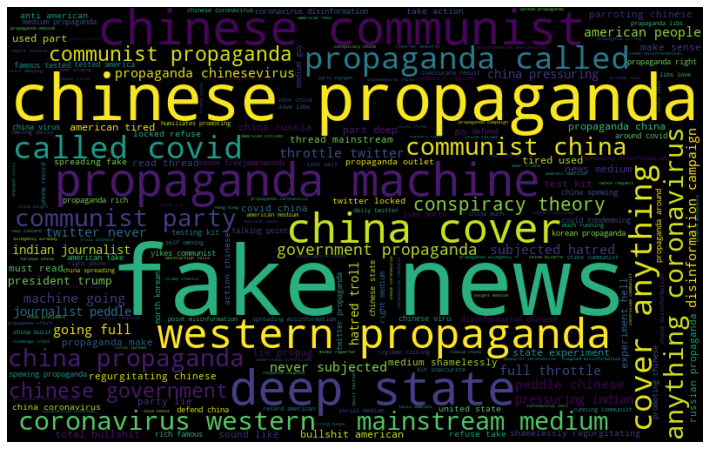

In [138]:
all_words = ' '.join([text for text in text_03_04_bad_words['text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(15, 8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [ ]:
#LDA主题分析

In [19]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

In [20]:
n_features = 1000

In [31]:
tf_vectorizer = CountVectorizer(strip_accents = 'unicode',
                                max_features=n_features,
                                stop_words='english',
                                max_df = 0.5,
                                min_df = 10)
tf = tf_vectorizer.fit_transform(text_01_china.text_tag)

In [32]:
from sklearn.decomposition import LatentDirichletAllocation

In [33]:
n_topics = 20
lda = LatentDirichletAllocation(n_components=n_topics, max_iter=50,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)

In [34]:
lda.fit(tf)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=50.0,
                          max_doc_update_iter=100, max_iter=50,
                          mean_change_tol=0.001, n_components=20, n_jobs=None,
                          perp_tol=0.1, random_state=0, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [35]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
    print()

In [36]:
n_top_words = 10

In [37]:
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, n_top_words)

Topic #0:
war propaganda time iran new casualty assault taking post populism
Topic #1:
influence government campaign vbn disinformation vbg sophisticated outcome designed carrying
Topic #2:
vbg russia trying massive iran spread influence propaganda expense running
Topic #3:
propaganda rb vbg ccp chinese right nns freedom human tibetan
Topic #4:
dangerous completely lead ground publication scientific inn overlook tai suggestion
Topic #5:
vbz hongkong interference vbg accuses parliament italy mfa lega bazzaro
Topic #6:
like video shameless start na ditch gon posting uighur nationalist
Topic #7:
unreliable mayor prague city vbg twinning partner told agreement sign
Topic #8:
taiwan disinformation election vbg rb spreading interfere prepared campaign vote
Topic #9:
rb nns vbp vb vbg interference propaganda cd nnp xinjiang
Topic #10:
party democrat dinner subversion know incitement vbz state revolution apparently
Topic #11:
vbp vbn nns want stand leadership spoken real trump make
Topic #12:
